In [1]:
import pandas as pd
import seaborn as sns
from scipy.stats import f_oneway
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import chi2_contingency
from sklearn.metrics import confusion_matrix

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
data=pd.read_csv('tmp8hqkfq5z.csv')
N_dataset=pd.read_csv('tmp8hqkfq5z.csv')

C:\Users\pooja\AppData\Local\Temp\ipykernel_8436\1296991020.py:1: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv('tmp8hqkfq5z.csv')
C:\Users\pooja\AppData\Local\Temp\ipykernel_8436\1296991020.py:2: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  N_dataset=pd.read_csv('tmp8hqkfq5z.csv')


In [4]:
data.head()

,object_id,permitnumber,worktype,permittypedescr,description,comments,applicant,declared_valuation,total_fees,issued_date,expiration_date,status,owner,occupancytype,sq_feet,address,city,state,zip,property_id,parcel_id,gpsy,gpsx,geom_2249,lat,long,geom_4326
0,1,A1000569,INTEXT,Amendment to a Long Form,Interior/Exterior Work,This work is to Amend Permit ALT347244. Elimin...,Patrick Sharkey,"$36,500.00",$390.00,2021-01-28 16:29:26+00,2021-07-28 04:00:00+00,Open,ONE 83 STATE ST CONDO TR,Mixed,0.0,181-183 State ST,Boston,MA,2109.0,130392.0,3.038070e+08,2.956235e+06,777000.467775,0101000020C9080000014080EF50B6274128B89653E58D...,42.359190,-71.052924,0101000020E6100000A703291D63C351C074AD05ECF92D...
1,2,A100071,COB,Amendment to a Long Form,City of Boston,Change connector link layout from attached enc...,Renee Santeusanio,"$40,000.00",$429.00,2011-11-04 15:04:58+00,2012-05-04 04:00:00+00,Open,CITY OF BOSTON,Comm,170.0,175 W Boundary RD,West Roxbury,MA,2132.0,17268.0,2.012032e+09,2.920239e+06,751016.119559,0101000020C908000081DB363D50EB264164AA649F9747...,42.260750,-71.149611,0101000020E61000005F23793993C951C071ECAA3E6021...
2,3,A1001012,OTHER,Amendment to a Long Form,Other,Amend Alt943748 to erect a roof deck as per pl...,Jusimar Oliveria,"$5,000.00",$70.00,2020-06-01 18:08:47+00,NaN,Open,15 PROSPECT STREET CONDOMINIUM TRUST,1-3FAM,0.0,15 Prospect ST,Charlestown,MA,2129.0,113443.0,2.028370e+08,2.962078e+06,775710.380542,0101000020C90800007E6BD6C23CAC2741422F500F4F99...,42.375243,-71.057585,0101000020E6100000F053B47AAFC351C0A6BB62F20730...
3,4,A1001201,INTEXT,Amendment to a Long Form,Interior/Exterior Work,Build steel balcony over garden level with sta...,Andreas Hwang,"$74,295.75",$803.00,2019-11-13 18:38:56+00,2020-05-13 04:00:00+00,Closed,LEDERMAN US REAL ESTATE CORP,Multi,0.0,211 W Springfield ST,Roxbury,MA,2118.0,129994.0,4.025580e+08,2.949423e+06,769648.312793,0101000020C9080000025726A0E07C274183505E499780...,42.340600,-71.080251,0101000020E6100000D72A24D322C551C044521DC4982B...
4,5,A100137,EXTREN,Amendment to a Long Form,Renovations - Exterior,Landscaping/stonework - amending permit #2801/...,NaN,"$15,000.00",$206.00,2013-01-03 19:13:09+00,2013-07-03 04:00:00+00,Open,MIARA SIMON,1-2FAM,0.0,14 William Jackson AVE,Brighton,MA,2135.0,149852.0,2.204944e+09,2.950791e+06,749690.298790,0101000020C9080000FCFDFA98F4E02641F6694F594383...,42.344600,-71.154051,0101000020E61000009DED6FF7DBC951C0929A5BD71B2C...


In [5]:
data['declared_valuation'] = data['declared_valuation'].str.replace('[\$,]', '', regex=True).astype(float)
data['total_fees'] = data['total_fees'].str.replace('[\$,]', '', regex=True).astype(float)

In [6]:
data['issued_date'] = pd.to_datetime(data['issued_date'], errors='coerce')
data['expiration_date'] = pd.to_datetime(data['expiration_date'], errors='coerce')

In [7]:
data.describe()

,object_id,declared_valuation,total_fees,sq_feet,property_id,parcel_id,gpsy,gpsx,lat,long
count,628540.000000,6.285400e+05,6.285400e+05,6.285400e+05,617759.000000,6.117170e+05,6.139990e+05,613999.000000,613999.000000,613999.000000
mean,314270.500000,2.363091e+05,4.055190e+03,1.764772e+04,121501.563555,1.025414e+09,2.944943e+06,768476.958641,42.328317,-71.084654
std,181444.013436,5.997943e+06,1.025476e+06,1.261363e+07,102864.660639,6.986243e+08,1.228020e+04,9599.925312,0.033634,0.035609
min,1.000000,-1.000000e+06,-1.124260e+06,0.000000e+00,0.000000,1.000010e+08,2.909159e+06,741292.796226,42.230291,-71.185400
25%,157135.750000,1.300000e+03,3.500000e+01,0.000000e+00,48511.000000,4.010371e+08,2.934848e+06,762399.999986,42.300610,-71.107140
50%,314270.500000,5.500000e+03,7.500000e+01,0.000000e+00,101367.000000,8.011060e+08,2.948571e+06,770766.818938,42.338260,-71.076174
75%,471405.250000,2.164800e+04,2.300000e+02,0.000000e+00,152285.000000,1.801655e+09,2.954017e+06,775436.904702,42.353150,-71.058830
max,628540.000000,2.100000e+09,6.250006e+08,1.000000e+10,459501.000000,2.205670e+09,2.969427e+06,792643.000014,42.395173,-70.994860


In [29]:
permit_type_counts = data['permittypedescr'].value_counts()
print(permit_type_counts)

permittypedescr
Short Form Bldg Permit          169951
Electrical Permit               132554
Plumbing Permit                  83939
Gas Permit                       60643
Electrical Low Voltage           48759
Long Form/Alteration Permit      41695
Electrical Fire Alarms           33149
Certificate of Occupancy         22075
Excavation Permit                17789
Electrical Temporary Service      8322
Amendment to a Long Form          4906
Erect/New Construction            3147
Use of Premises                   1487
Foundation Permit                  124
Name: count, dtype: int64


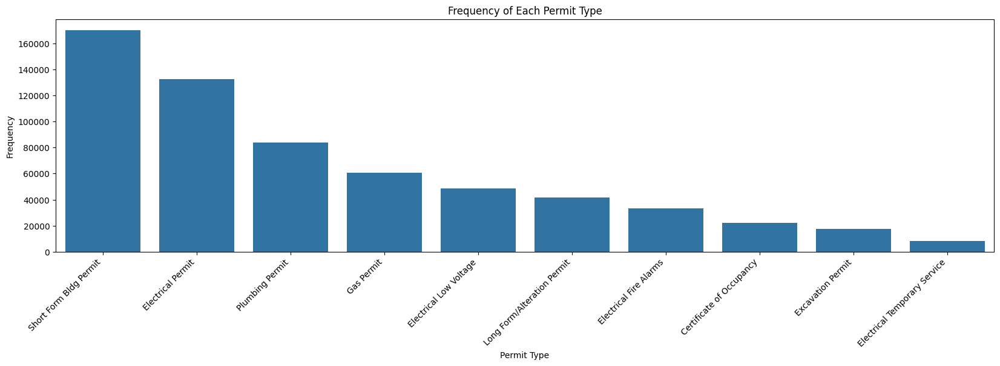

In [8]:
permit_type_counts = data['permittypedescr'].value_counts()
# Plot a bar chart
plt.figure(figsize=(20, 5))
sns.barplot(x=permit_type_counts[:10].index, y=permit_type_counts[:10].values)
plt.title('Frequency of Each Permit Type')
plt.xlabel('Permit Type')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right') 
plt.show()

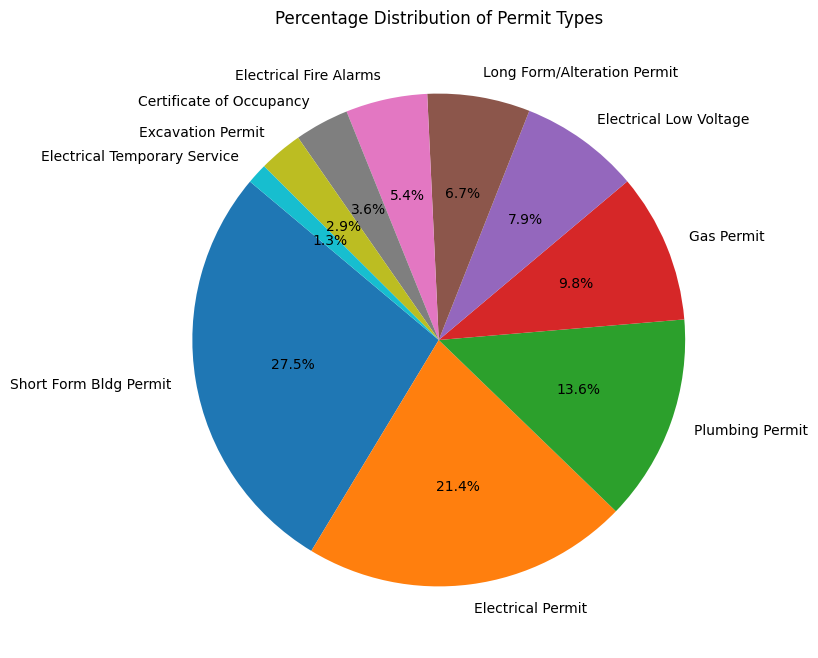

In [9]:
plt.figure(figsize=(8, 8))
plt.pie(permit_type_counts[:10], labels=permit_type_counts[:10].index, autopct='%1.1f%%', startangle=140)
plt.title('Percentage Distribution of Permit Types')
plt.show()

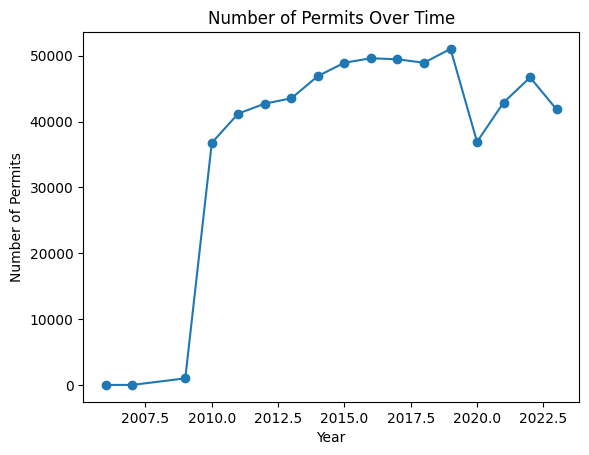

.


In [10]:
data['issued_year'] = data['issued_date'].dt.year
permit_count_by_year = data.groupby('issued_year')['permitnumber'].count()
permit_count_by_year.plot(kind='line', marker='o', title='Number of Permits Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Permits')
plt.show()
print('.')

C:\Users\pooja\AppData\Local\Temp\ipykernel_8436\451048768.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 5))


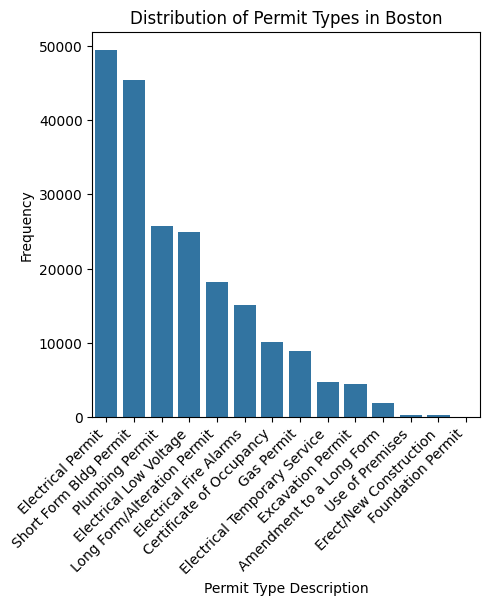

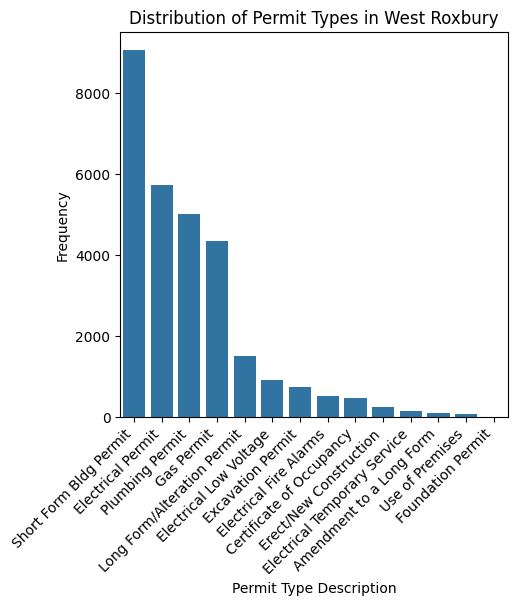

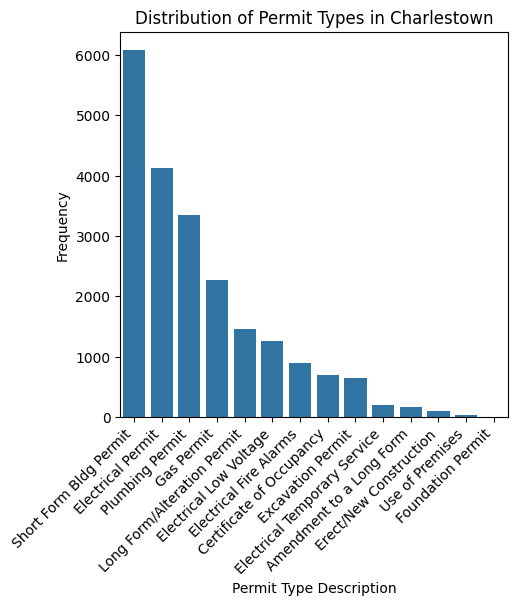

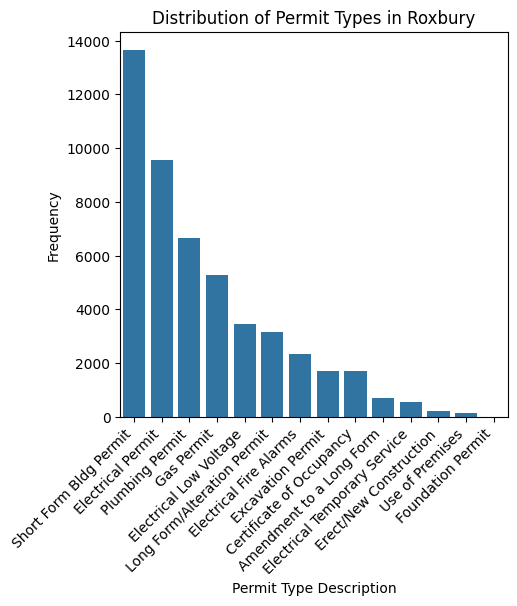

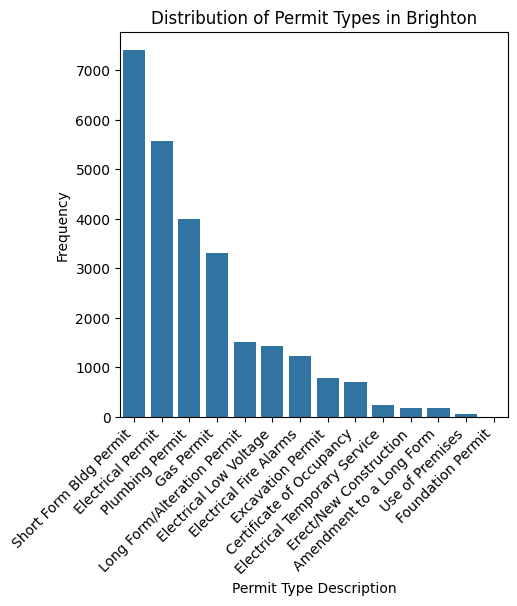

...

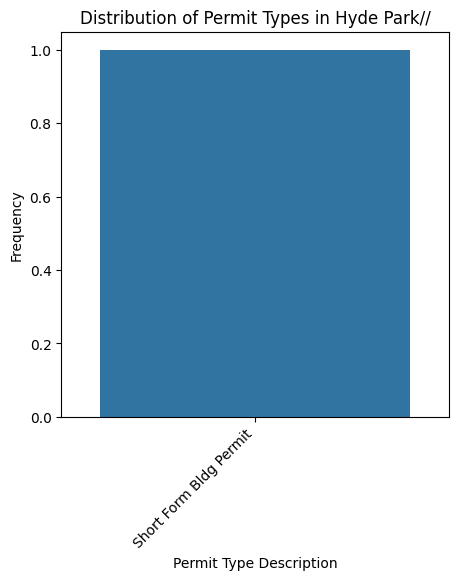

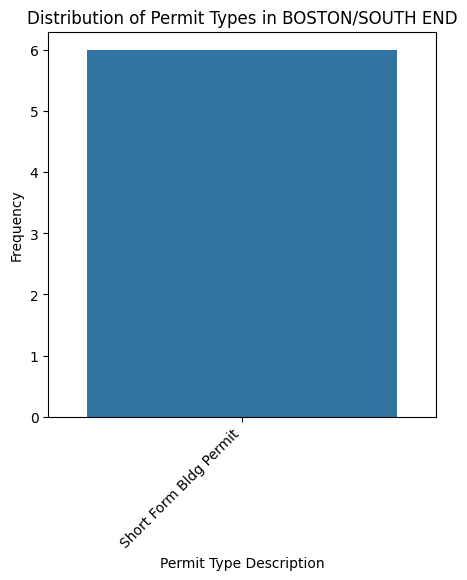

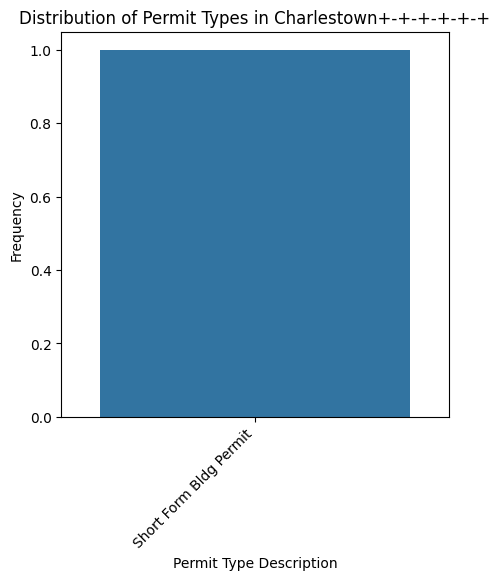

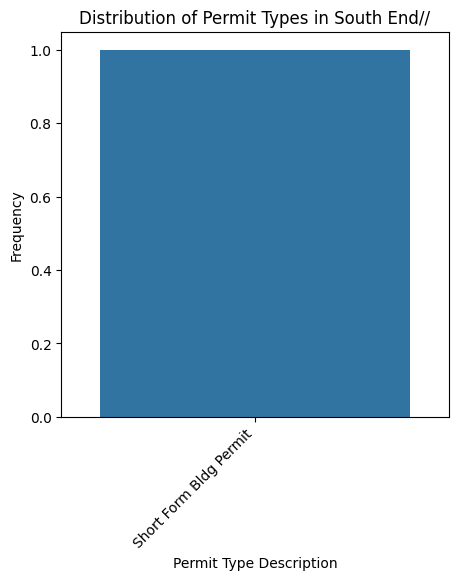

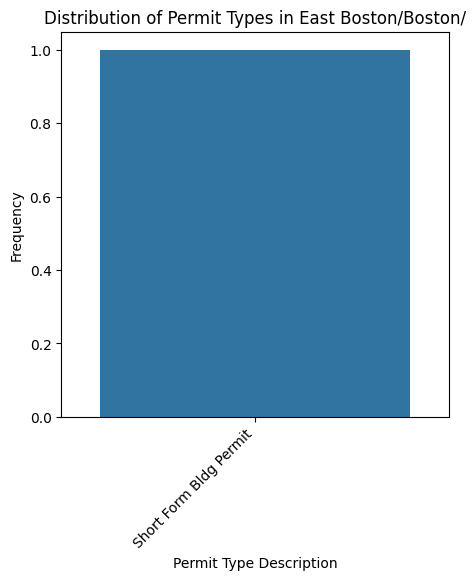

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

unique_city = data['city'].unique()

for city in unique_city:
    city_data = data[data['city'] == city]
    permit_type_counts_by_city = city_data['permittypedescr'].value_counts()
    plt.figure(figsize=(5, 5))
    sns.barplot(x=permit_type_counts_by_city.index, y=permit_type_counts_by_city.values)
    plt.title(f'Distribution of Permit Types in {city}')
    plt.xlabel('Permit Type Description')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
plt.show()


For permit type Amendment to a Long Form, the city with the highest average declared value is NorthEnd with an average declared value of 3180609.28


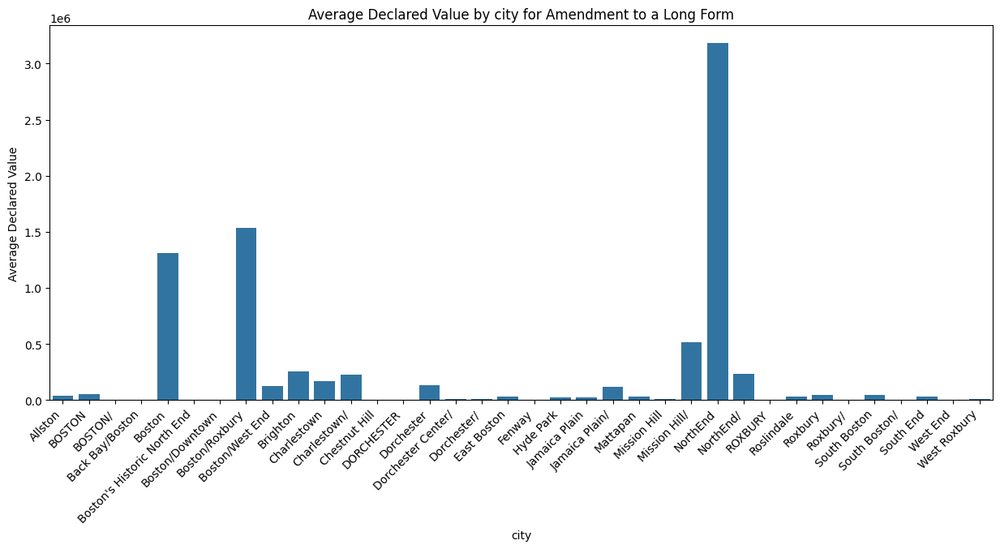

For permit type Certificate of Occupancy, the city with the highest average declared value is BOSTON/ with an average declared value of 7500000.0


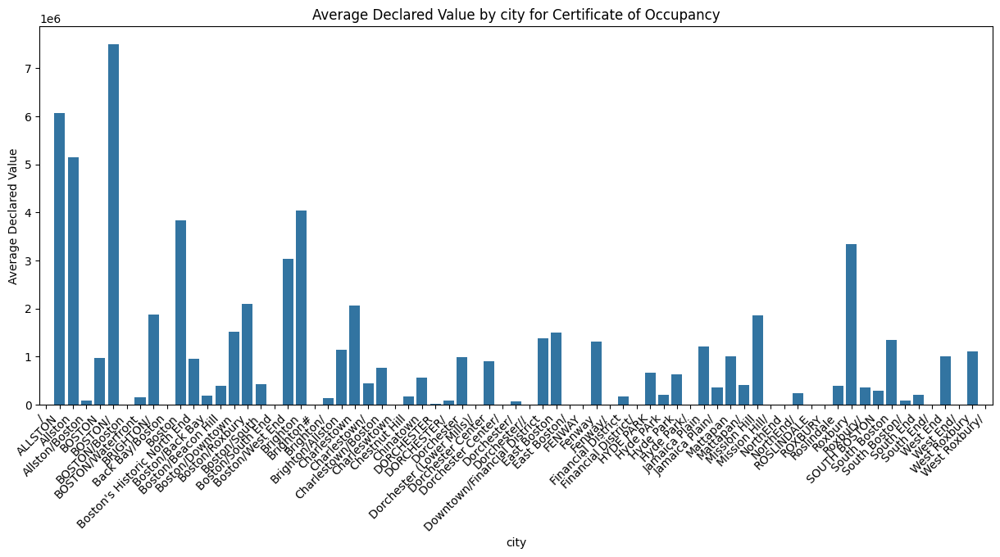

For permit type Long Form/Alteration Permit, the city with the highest average declared value is West End/ with an average declared value of 7200000.0


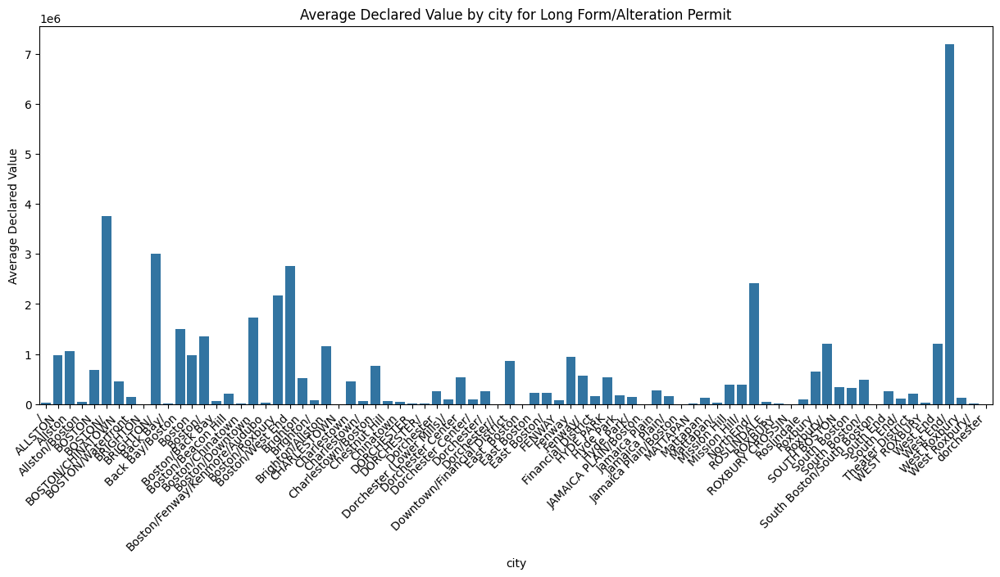

For permit type Electrical Permit, the city with the highest average declared value is Charlestown// with an average declared value of 579000.0


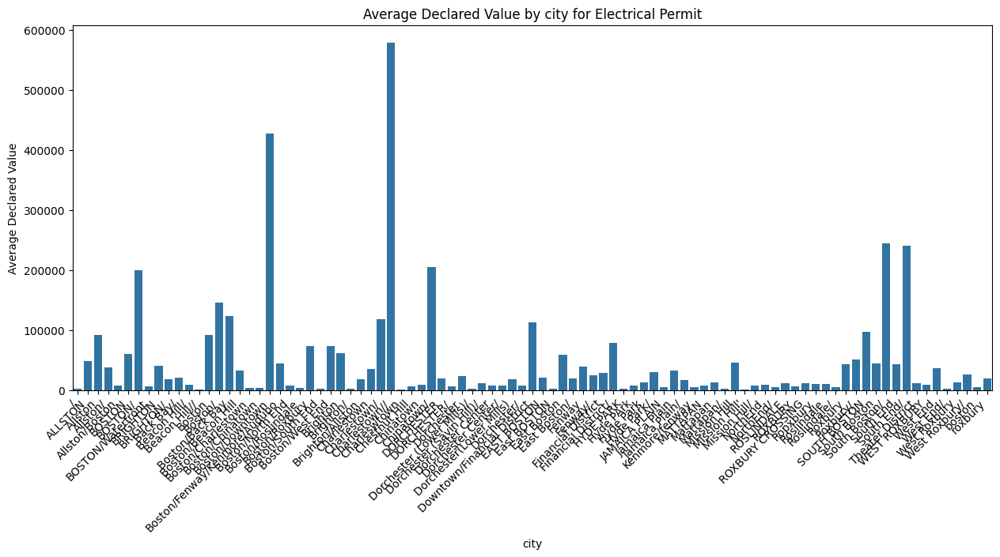

For permit type Short Form Bldg Permit, the city with the highest average declared value is Dorchester/ with an average declared value of 61095491.1


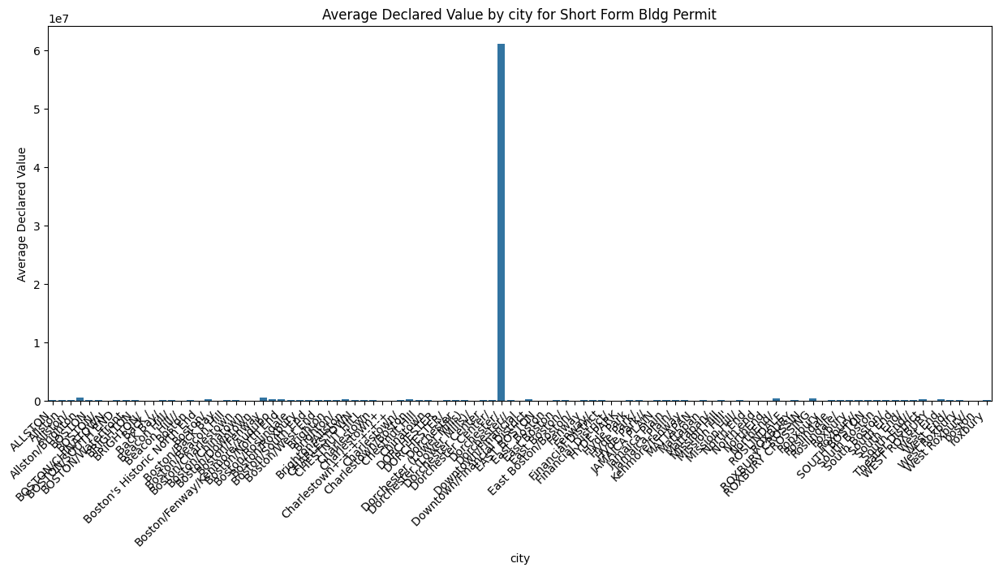

For permit type Electrical Fire Alarms, the city with the highest average declared value is Brighton/Allston with an average declared value of 100346.5


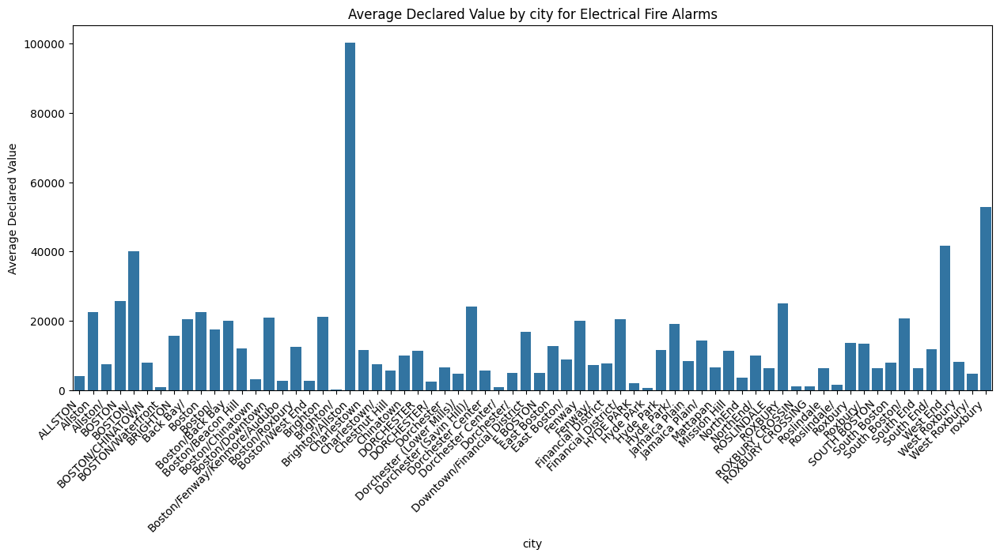

For permit type Electrical Low Voltage, the city with the highest average declared value is Boston/West End with an average declared value of 108227.27272727272


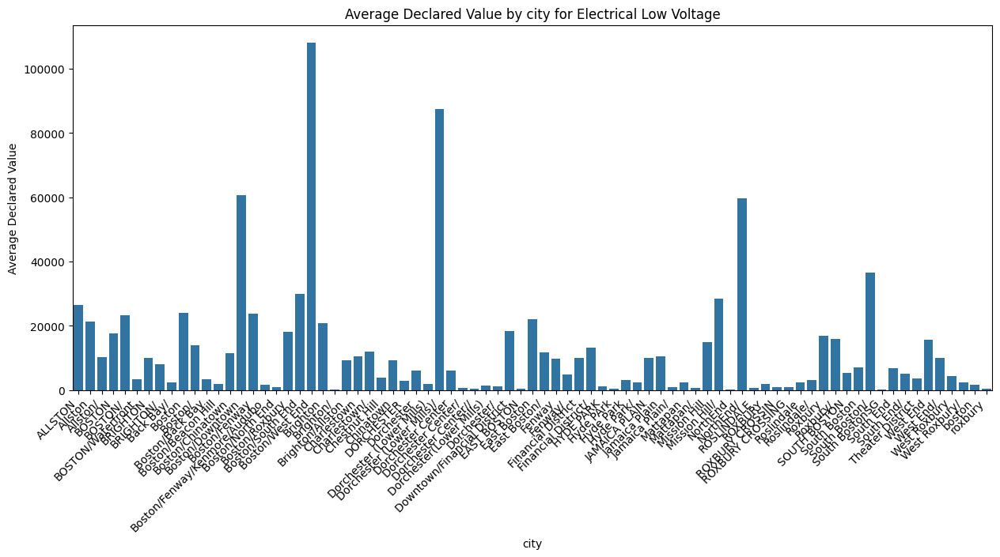

For permit type Erect/New Construction, the city with the highest average declared value is Back Bay/ with an average declared value of 117695710.0


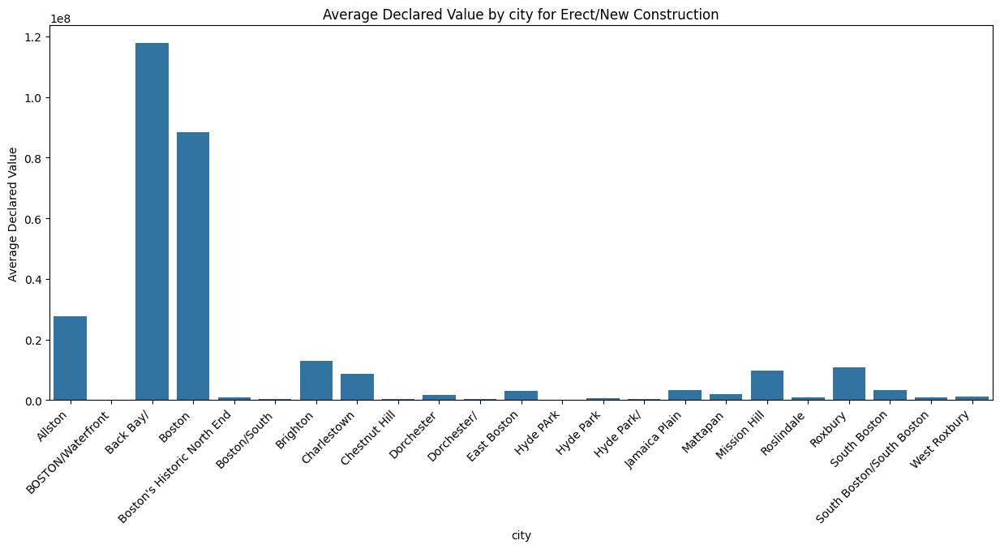

For permit type Electrical Temporary Service, the city with the highest average declared value is West Roxbury/ with an average declared value of 70000.0


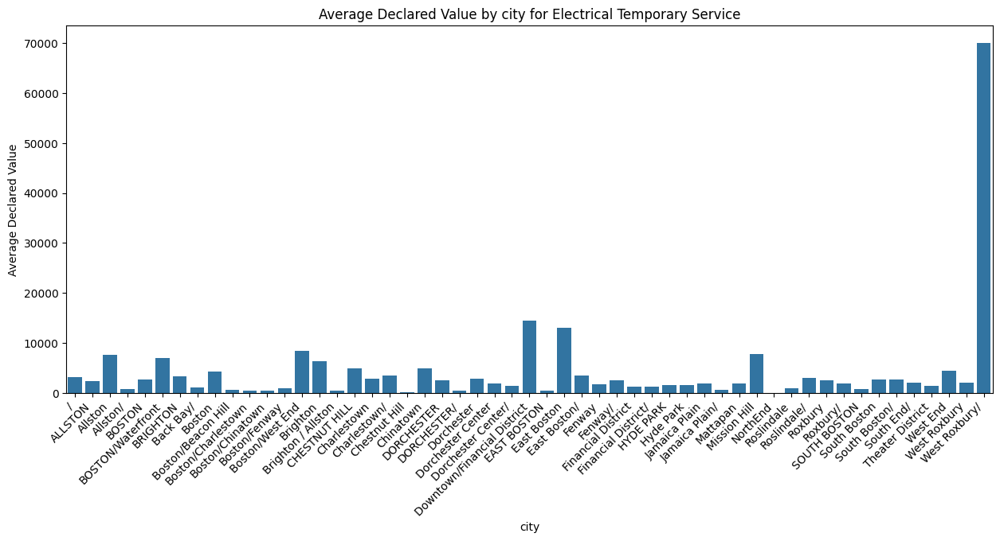

For permit type Excavation Permit, the city with the highest average declared value is Allston with an average declared value of 0.0


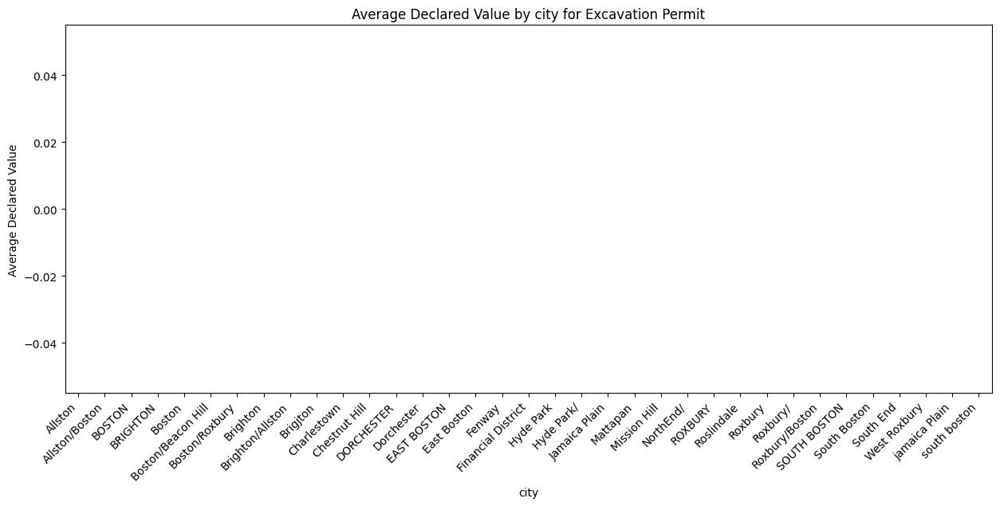

For permit type Gas Permit, the city with the highest average declared value is Fenway with an average declared value of 10021540.0


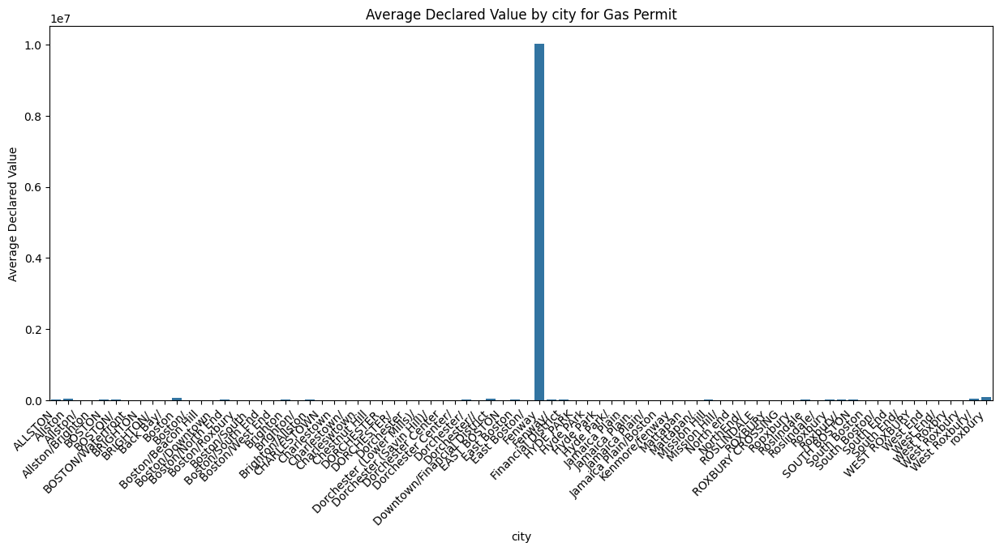

For permit type Plumbing Permit, the city with the highest average declared value is Allston/ with an average declared value of 4365142.857142857


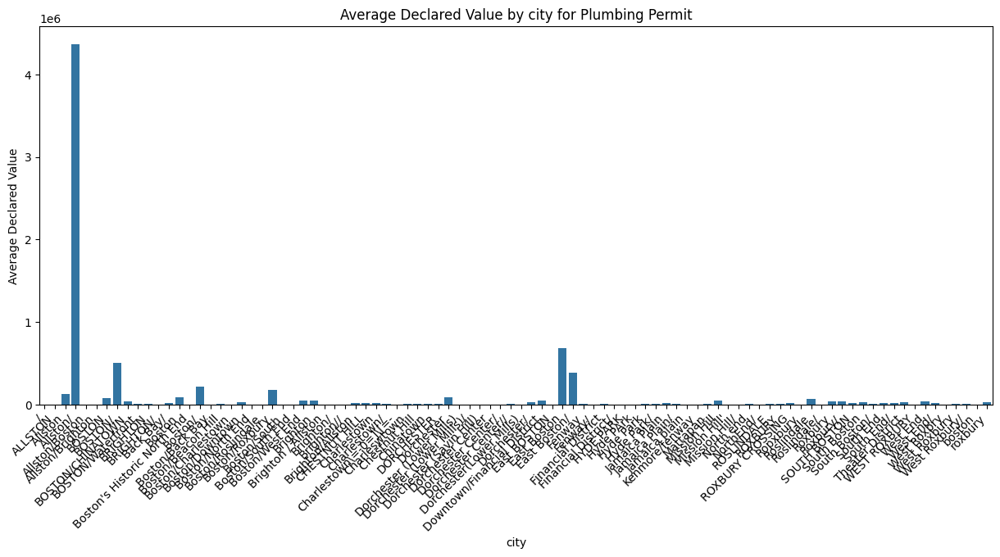

For permit type Foundation Permit, the city with the highest average declared value is Roxbury with an average declared value of 34263502.5


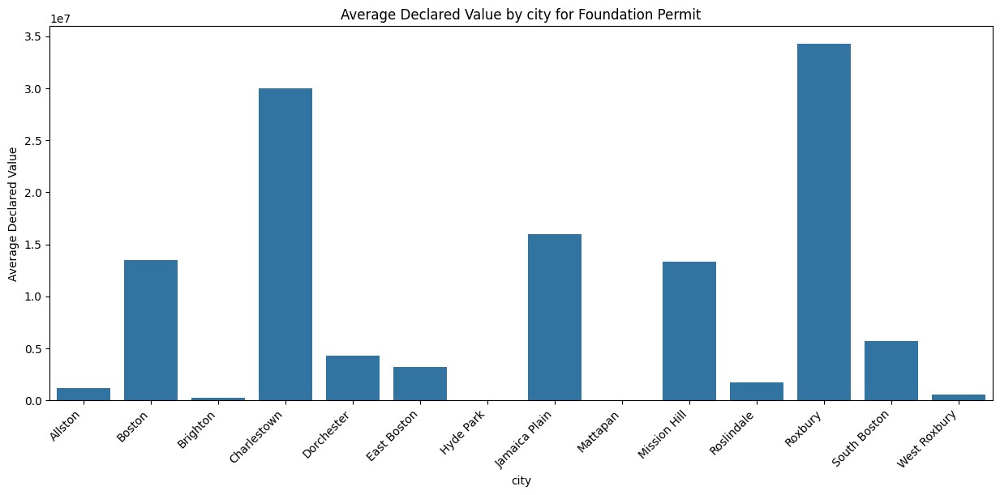

For permit type Use of Premises, the city with the highest average declared value is Hyde Park with an average declared value of 55124.78431372549


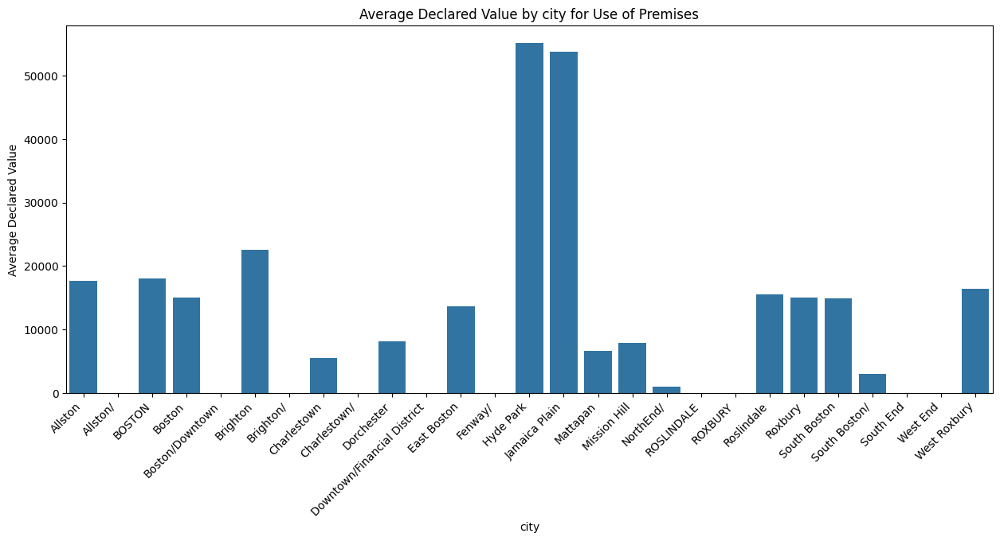

In [12]:
unique_permit_types = data['permittypedescr'].unique()
for permit_type in unique_permit_types:
    permit_type_data = data[data['permittypedescr'] == permit_type]
    if not permit_type_data.empty:
        avg_declared_value_by_city = permit_type_data.groupby('city')['declared_valuation'].mean()
        if not avg_declared_value_by_city.empty:
            city_with_highest_declared_value = avg_declared_value_by_city.idxmax()
            highest_declared_value_city = avg_declared_value_by_city.max()
            print(f"For permit type {permit_type}, the city with the highest average declared value is {city_with_highest_declared_value} with an average declared value of {highest_declared_value_city}")

            plt.figure(figsize=(15, 6))
            sns.barplot(x=avg_declared_value_by_city.index, y=avg_declared_value_by_city.values)
            plt.title(f'Average Declared Value by city for {permit_type}')
            plt.xlabel('city')
            plt.ylabel('Average Declared Value')
            plt.xticks(rotation=45, ha='right')
            plt.show()


C:\Users\pooja\AppData\Local\Temp\ipykernel_8436\1492825737.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_declared_value_by_permit_type.index, y=avg_declared_value_by_permit_type.values, palette='viridis')


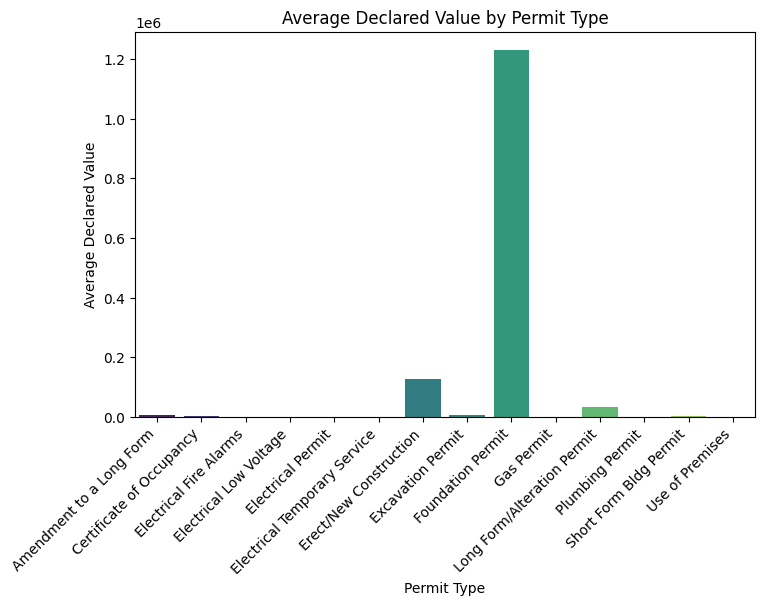

In [13]:
s

In [14]:
data.drop(['object_id','comments', 'applicant','owner', 'occupancytype', 'sq_feet',
    'address', 'zip',
    'property_id', 'parcel_id','state', 'gpsy', 'gpsx', 'geom_2249',
    'lat', 'long', 'geom_4326'], axis=1, inplace=True)

In [15]:
data.columns

Index(['permitnumber', 'worktype', 'permittypedescr', 'description',
       'declared_valuation', 'total_fees', 'issued_date', 'expiration_date',
       'status', 'city', 'issued_year'],
      dtype='object')

In [16]:
categorical_features = [feature for feature in data.columns if data[feature].dtype == 'O']
print(categorical_features)

['permitnumber', 'worktype', 'permittypedescr', 'description', 'status', 'city']


In [17]:
N_dataset.drop(['object_id','comments', 'applicant','owner', 'occupancytype', 'sq_feet',
    'address', 'zip',
    'property_id', 'parcel_id', 'gpsy', 'gpsx','state','geom_2249',
    'lat', 'long', 'geom_4326'], axis=1, inplace=True)

In [18]:
N_dataset['issued_date'] = pd.to_datetime(N_dataset['issued_date'], errors='coerce')
N_dataset['expiration_date'] = pd.to_datetime(N_dataset['expiration_date'], errors='coerce')

In [19]:
N_dataset['declared_valuation'] = N_dataset['declared_valuation'].str.replace('[\$,]', '', regex=True).astype(float)
N_dataset['total_fees'] = N_dataset['total_fees'].str.replace('[\$,]', '', regex=True).astype(float)

In [20]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

for column in categorical_features:
    N_dataset[column]= encoder.fit_transform(N_dataset[column])

In [21]:
N_dataset.head()

,permitnumber,worktype,permittypedescr,description,declared_valuation,total_fees,issued_date,expiration_date,status,city
0,0,39,0,40,36500.00,390.0,2021-01-28 16:29:26+00:00,2021-07-28 04:00:00+00:00,2,19
1,1,14,0,10,40000.00,429.0,2011-11-04 15:04:58+00:00,2012-05-04 04:00:00+00:00,2,128
2,2,48,0,46,5000.00,70.0,2020-06-01 18:08:47+00:00,NaT,2,44
3,3,39,0,40,74295.75,803.0,2019-11-13 18:38:56+00:00,2020-05-13 04:00:00+00:00,0,112
4,4,23,0,52,15000.00,206.0,2013-01-03 19:13:09+00:00,2013-07-03 04:00:00+00:00,2,35


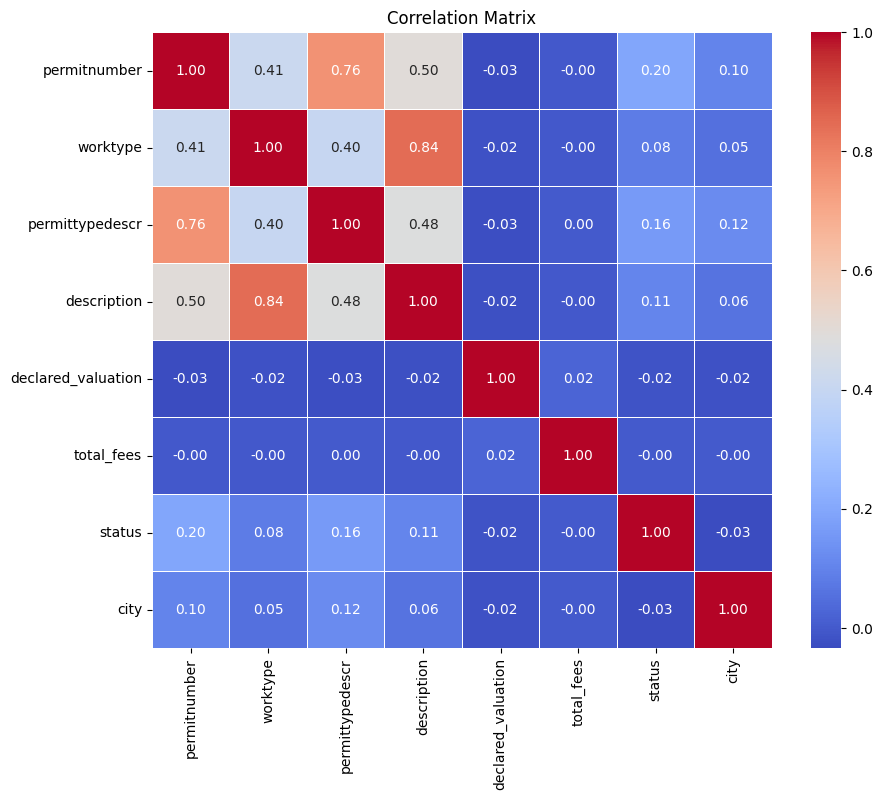

In [22]:

numerical_columns = N_dataset.select_dtypes(include='number')

correlation_matrix = numerical_columns.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()



In [23]:
N_dataset.head()

,permitnumber,worktype,permittypedescr,description,declared_valuation,total_fees,issued_date,expiration_date,status,city
0,0,39,0,40,36500.00,390.0,2021-01-28 16:29:26+00:00,2021-07-28 04:00:00+00:00,2,19
1,1,14,0,10,40000.00,429.0,2011-11-04 15:04:58+00:00,2012-05-04 04:00:00+00:00,2,128
2,2,48,0,46,5000.00,70.0,2020-06-01 18:08:47+00:00,NaT,2,44
3,3,39,0,40,74295.75,803.0,2019-11-13 18:38:56+00:00,2020-05-13 04:00:00+00:00,0,112
4,4,23,0,52,15000.00,206.0,2013-01-03 19:13:09+00:00,2013-07-03 04:00:00+00:00,2,35


In [24]:
anova_results = f_oneway(*[data[data['permittypedescr'] == permit_type]['declared_valuation'] for permit_type in permit_type_counts[::].index])

print("ANOVA Results:")
print(anova_results)


ANOVA Results:
F_onewayResult(statistic=975.4437566647589, pvalue=0.0)


In [25]:
anova_results_fees = f_oneway(*[data[data['permittypedescr'] == permit_type]['total_fees'] for permit_type in permit_type_counts[:10].index])

print("ANOVA Results for Total Fees:")
print(anova_results_fees)


ANOVA Results for Total Fees:
F_onewayResult(statistic=4.732917444343692, pvalue=2.557636037293247e-06)


In [26]:
from scipy.stats import chi2_contingency
df_test = data[['permittypedescr', 'description']]
contingency_table = pd.crosstab(df_test['permittypedescr'], df_test['description'])
chi2, p_value, _, _ = chi2_contingency(contingency_table)
print(f"Chi-Square Value: {chi2}")
print(f"P-Value: {p_value}")


Chi-Square Value: 4934958.305492353
P-Value: 0.0


In [27]:
df_test = data[['permittypedescr', 'city']]
contingency_table = pd.crosstab(df_test['permittypedescr'], df_test['city'])
chi2, p_value, _, _ = chi2_contingency(contingency_table)
print(f"Chi-Square Value: {chi2}")
print(f"P-Value: {p_value}")


Chi-Square Value: 48237.498160870324
P-Value: 0.0


In [28]:
N_dataset = N_dataset.drop(['issued_date', 'expiration_date'], axis=1)
X = N_dataset.drop(['permittypedescr'], axis=1)
y = N_dataset['permittypedescr']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(report)


Accuracy: 0.9998011264199573
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       955
           1       1.00      1.00      1.00      4399
           2       1.00      1.00      1.00      6671
           3       1.00      1.00      1.00      9712
           4       1.00      1.00      1.00     26494
           5       1.00      1.00      1.00      1642
           6       1.00      1.00      1.00       602
           7       1.00      1.00      1.00      3436
           8       1.00      0.96      0.98        26
           9       1.00      1.00      1.00     12072
          10       1.00      1.00      1.00      8374
          11       1.00      1.00      1.00     16929
          12       1.00      1.00      1.00     34101
          13       1.00      1.00      1.00       295

    accuracy                           1.00    125708
   macro avg       1.00      1.00      1.00    125708
weighted avg       1.00     

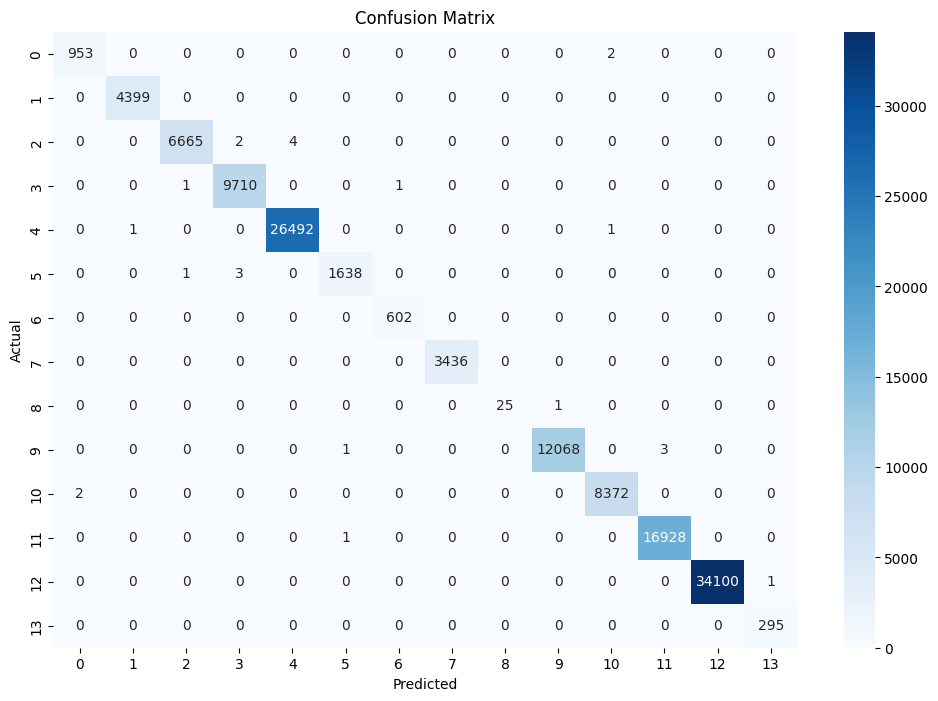

C:\Users\pooja\AppData\Local\Temp\ipykernel_8436\405862394.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rf_classifier.classes_, y=class_accuracy, palette='viridis')


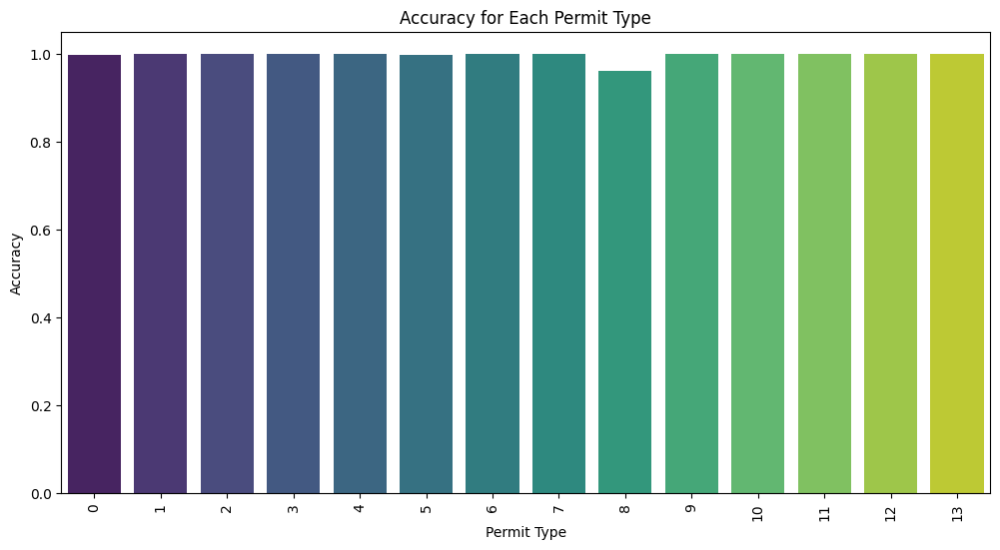

In [30]:
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=rf_classifier.classes_, yticklabels=rf_classifier.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

class_accuracy = conf_mat.diagonal() / conf_mat.sum(axis=1)
plt.figure(figsize=(12, 6))
sns.barplot(x=rf_classifier.classes_, y=class_accuracy, palette='viridis')
plt.xlabel('Permit Type')
plt.ylabel('Accuracy')
plt.title('Accuracy for Each Permit Type')
plt.xticks(rotation=90)
plt.show()
